In [1]:
from files.utils.constants import *
from files.utils.dataset_creator import *
from files.utils.utility_functions import *
from files.models.neural_models import *
# from files.NeuralRansac import *
from files.pif.pif import *

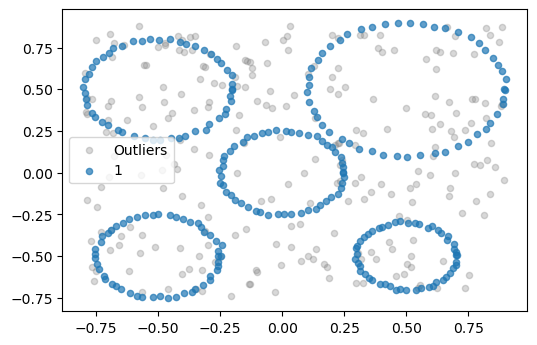

In [2]:
# ds = read_np_array(joinpath("..", "..", "..", "datasets", "2d", "lines", "with_outliers", "stair4.csv")).astype(float)
# gt = read_np_array(joinpath("..", "..", "..", "datasets", "2d", "lines", "with_outliers", "stair4_gt.csv")).astype(int).reshape(len(ds))
# plot(ds, c=gt)
ds, gt = load_dataset_by_name("circle5", file_path=joinpath("..", "..", "..", "datasets/2d/circles/with_outliers"))
plot_clusters(gt, ds)

In [76]:
def get_residuals(ds, preds):
    residuals = np.array([
        np.min([euclidean_distance(p, d) for p in preds])
        for d in ds
    ])
    return residuals

In [138]:
model = AEModel(n_inputs=2, n_first_hidden=16, n_outputs=2, activation=torch.tanh)

idxs = np.random.randint(0, len(ds), size=(2,))
model.fit(data=ds[idxs], epochs=500, print_training=False);
print("Finished training")
preds = model.predict(ds)

Finished training


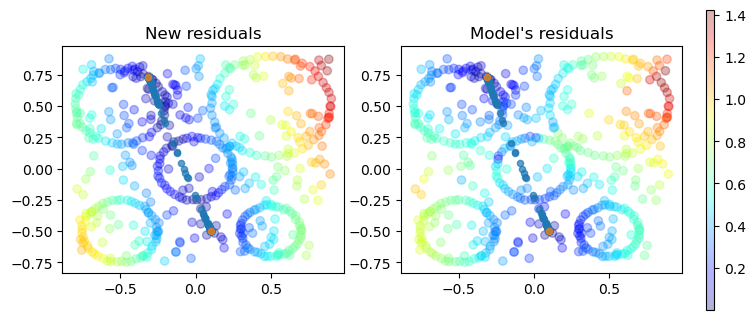

In [139]:
fig, (ax1, ax2) = plt.subplots(1, 2, dpi=100, figsize=(8, 3))
ax1.set_title("New residuals")
ax1.scatter(ds[:,0], ds[:,1], c=get_residuals(ds, preds), cmap="jet", alpha=0.3)
plot(preds, ax=ax1)
plot(ds[idxs], ax=ax1)

ax2.set_title("Model's residuals")
im1 = ax2.scatter(ds[:,0], ds[:,1], c=model.get_residuals(ds), cmap="jet", alpha=0.3)
plot(preds, ax=ax2)
plot(ds[idxs], ax=ax2)
fig.colorbar(im1, cax=fig.add_axes([0.93, 0, 0.01, 1]))
# plt.colorbar()

In [ ]:
# SOM: 10m 50s
# LINE: 2m 55s
# AE: 

std = 0.004
# thresholds = [1/3*std, 1/2*std, std, 3/2*std, 2*std, 3*std, 5*std]
# thresholds = [5*std, 7*std, 10*std, 15*std]
k = np.array([0.5, 1, 2, 4, 6, 8, 10],)
scores_list = []
for threshold in std*k:
    print("Threshold ", threshold)
    ransac = PreferenceIsolationForest(data=ds, model_name=SOM, in_th=threshold, epochs=500, verbose=0)
    scores_list.append(ransac.anomaly_detection(num_models=1000))

In [ ]:
for score in scores_list:
    make_roc(gt, score)

In [ ]:
p = r"/home/catonz/Projects/Python/AI/Tesi/test/results/test_27-06-02-30-44/stair4/som/in_th_0_016/uniform/scores.json"
with open(p, 'r') as f:
    scores = json.load(f)
# scores = read_dict_json(p)
scores = np.array(scores["arr"])
make_roc(gt, scores);

In [ ]:
for score in scores_list:
    plt.scatter(ds[:,0], ds[:,1], c=score, cmap="jet")
    plt.colorbar()
    plt.show()

In [ ]:
mtrx = ransac.preference_matrix
for i in np.random.randint(0, mtrx.shape[1], 10):
    #print(np.all(mtrx[:,i] == 0))
    fig = plt.figure(dpi=100)
    fig.suptitle(f"Model {i}")
    plt.scatter(ds[:,0], ds[:,1], c=mtrx[:,i], cmap='jet')
    preds = ransac.models_ithrs[i,0].predict(ds)
    plt.scatter(preds[:,0], preds[:,1])
    plt.colorbar()

In [ ]:
def compute_inlier_factor(som, p):
    bmu = som.minisom.winner(p)
    neighbs = np.array(find_neighbors(
        som.minisom.get_weights(), bmu, itself=True))
    distances = [euclidean_distance(p, n) for n in neighbs]
    return np.mean(distances)

In [ ]:
from files.self_organizing_maps.self_organizing_maps import *

ds = ds.astype(float)
som = SelfOrganizingMaps(data=ds, init_type=PCA, n_cols=3, n_rows=3)
sub_sampl = ds[np.random.randint(0, len(ds), 5)]
som.fit(epochs=1000, data=sub_sampl, verbose=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
som.plot_weights_lattice(ds, ax=ax1)
plot(sub_sampl, c='r', ax=ax1)

plot(ds, ax=ax2)
plot(som.get_inliers(data=ds, v=NEW_INLIERS, in_th=1.4826), ax=ax2)

In [ ]:
factors = np.array(list(map(som.compute_inlier_factor, ds)))
mask = factors < 0.05*3
plot(ds[~mask], c='gray', alpha=0.3)
plot(ds[mask])

In [ ]:
vecf = np.vectorize(compute_inlier_factor)
r = vecf(som=som, p=ds)
factors.shape, r.shape

In [ ]:
# euclidean_distance(a[0,:], a[0,:], single=False)
np.linalg.norm(a - a[1], axis=1)

In [ ]:
a = np.random.uniform(size=(int(1e5), 2))
f = lambda x, y: (x+3)*y if x < 0.5 else 0

st = time.time()
res1 = np.array([euclidean_distance(p, a[1]) for p, s in a])
print(f"Res1 time: {time.time()-st}")

st = time.time()
#res2 = np.array(list(map(f, a[:,0], a[:,1])))
print(f"Res2 time: {time.time()-st}")

def euclidean_distance2(arr1, arr2):
    return np.linalg.norm(arr1, arr2)

st = time.time()
vecf = np.vectorize(np.linalg.norm)
res3 = vecf(a-a[1])
print(f"Res3 time: {time.time()-st}")


In [ ]:
res3.shape

In [ ]:
np.all(res1==res3)# and np.all(res3==res2) #and np.all(res1==res3)

In [ ]:
np.where(res1 != res3)[0].shape

In [ ]:
res3.shape

In [ ]:
arr = np.array([[0, 1], [1, 0], [1, 1]])
np.linalg.norm(arr - [0, 0], axis=1)

In [ ]:
data = np.random.uniform(size=(1000, 2))
preds = np.random.uniform(size=(1000, 2))
arr1 = np.array([euclidean_distance(p, pred)
                             for p, pred in zip(data, preds)])
arr2 = np.linalg.norm(data - preds, axis=1)
np.all(arr1 == arr2), arr1.shape, arr2.shape
                            

In [ ]:
w = np.where(arr1 != arr2)
arr1[w][0], arr2[w][0]

In [18]:
def extract_results_paths(base_path, results=None):
    results = np.array([]) if results is None else results
    dirs = os.listdir(base_path)
    if "results.json" in dirs:
        ret = np.array([joinpath(base_path, "results.json")])
        return ret
    else:
        for d in dirs:
            d = joinpath(base_path, d)
            if os.path.isdir(d):
                for r in extract_results_paths(d, results):
                    if r not in results.tolist():
                        results = np.append(results, r)
        return results


def extract_results(base_path, towrite=False):

    results_paths = extract_results_paths(base_path)
    final_results = {}
    for path in results_paths:
        params = read_arr_json(path, return_dict=True)
        mn = params["model_name"]
        if mn not in final_results.keys():
            final_results[mn] = {}
        ds_name = params["dataset_name"]
        if ds_name not in final_results[mn].keys():
            final_results[mn][ds_name] = {}
            # final_results[fc][ds_name]["npoints"] = params["npoints"]
        in_th_num = str(params["in_th_to_test"]).replace(".", "_")
        # in_th = f"in_th_{in_th_num}"
        in_th = params["in_th_to_test"]
        in_th = str(in_th)
        if in_th not in final_results[mn][ds_name].keys():
            final_results[mn][ds_name][in_th] = {}

        if LOCALIZED in path:
            final_results[mn][ds_name][in_th]["roc_auc_localized"] = params["roc_auc"]
        elif UNIFORM in path:
            final_results[mn][ds_name][in_th]["roc_auc_uniform"] = params["roc_auc"]
        final_results[mn][ds_name][in_th]["scores_path"] = params["scores_path"]
        final_results[mn][ds_name][in_th]["exec_time_seconds"] = params["exec_time_seconds"]
        
    for mn, dict1 in final_results.items():
        for ds_name, dict2 in dict1.items():
            thresholds = list(dict2.keys())
            try:
                roc_aucs = [dict2[v]["roc_auc_localized"]
                             for v in thresholds]
                final_results[mn][ds_name]["roc_auc_localized_median"] = np.median(roc_aucs)
                final_results[mn][ds_name]["roc_auc_localized_mean"] = np.mean(roc_aucs)
            except KeyError:
                pass
            try:
                roc_aucs = [dict2[v]["roc_auc_uniform"]
                             for v in thresholds]
                final_results[mn][ds_name]["roc_auc_uniform_median"] = np.median(roc_aucs)
                final_results[mn][ds_name]["roc_auc_uniform_mean"] = np.mean(roc_aucs)
            except KeyError:
                pass
            exec_times = [dict2[v]["exec_time_seconds"]
                          for v in thresholds]
            final_results[mn][ds_name]["exec_time_seconds_mean"] = np.mean(
                exec_times)

    os.makedirs(joinpath(base_path), exist_ok=True)
    if towrite:
        write_dict_json(final_results, joinpath(
            base_path, "summary_results.json"))
    return final_results

def make_roc(gt, scores, show=True, title="", orig_ax=None):
    # scores_norm = softmax(scores_old)
    fpr, tpr, thr = roc_curve(gt, scores, pos_label=0)
    roc_auc: float = auc(fpr, tpr)

    lw = 2
    if orig_ax is None:
        fig = plt.figure(dpi=100)
        ax = fig.add_subplot(111, aspect='equal')
    else:
        ax = orig_ax
        ax.set_aspect("equal")
    ax.plot(fpr, tpr, color='darkorange', lw=lw,
            label='ROC curve (area = %0.2f)' % roc_auc)
    ax.plot([0, 1], [0, 1], color='navy', lw=lw,
            linestyle='--', label="Baseline")
    stop = 0
    ax.plot(fpr[stop:], thr[stop:], color='mediumseagreen',
             lw=lw, linestyle='--', label="Threshold")
    # ax.plot(fpr, thr, color='navy', lw=lw, linestyle='--', label="thr")
    # plt.axis('equal')
    ax.set_xlim([-0.05, 1.05])
    ax.set_ylim([-0.05, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(
        'Receiver Operating Characteristic curve' if title == "" else title)
    ax.legend(loc="lower right")
    # plt.tight_layout()

    if show:
        plt.show()

    return roc_auc, fpr, tpr, thr, fig if orig_ax is None else None

In [19]:
bp = r"/home/catonz/Projects/Python/AI/Tesi/test/results/test_28-06-10-23-43"
results = extract_results(bp)

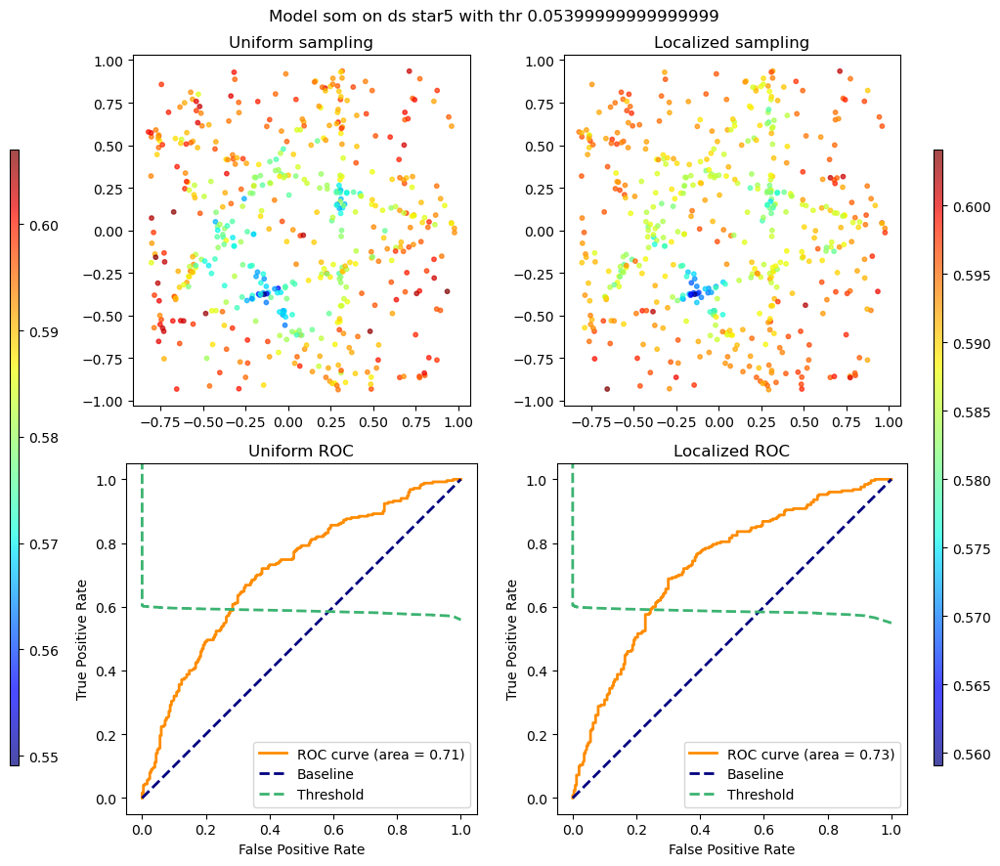

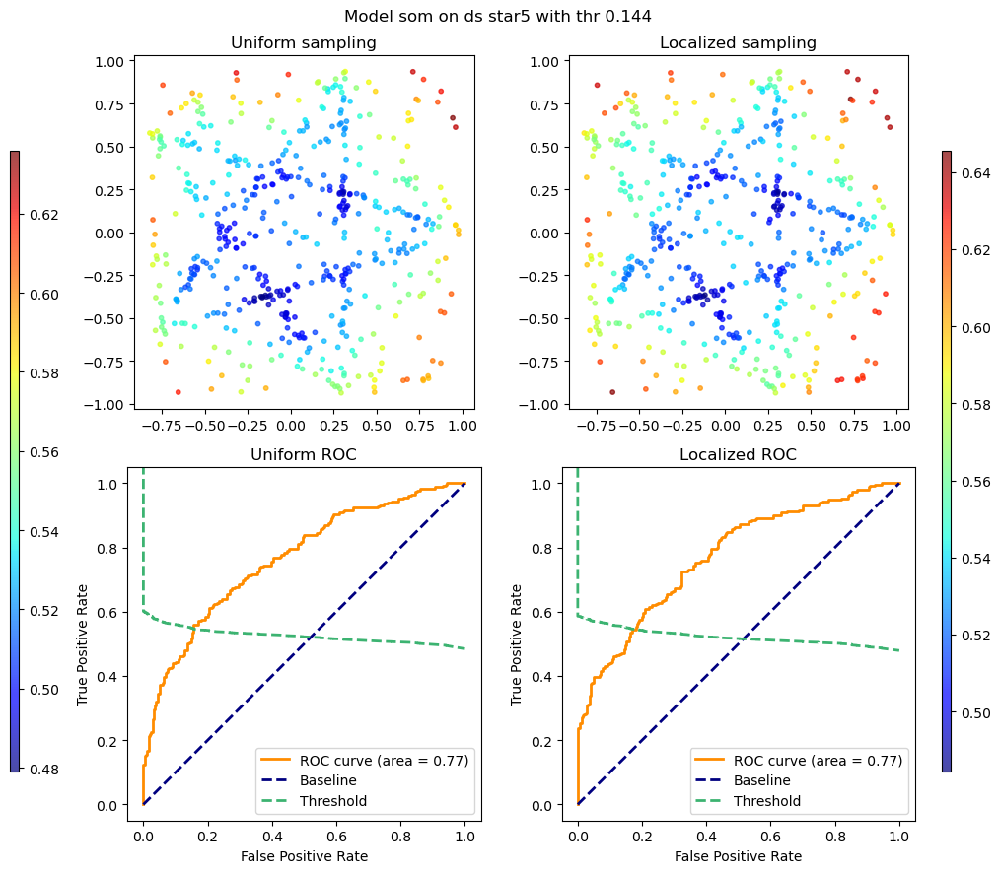

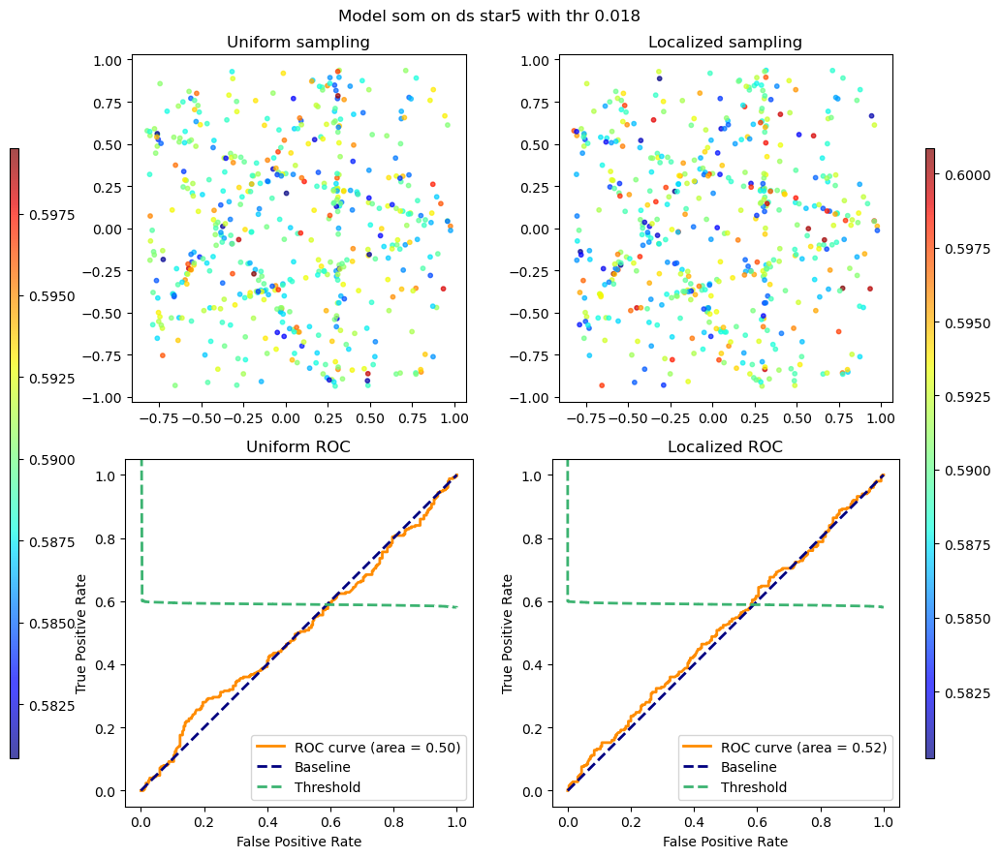

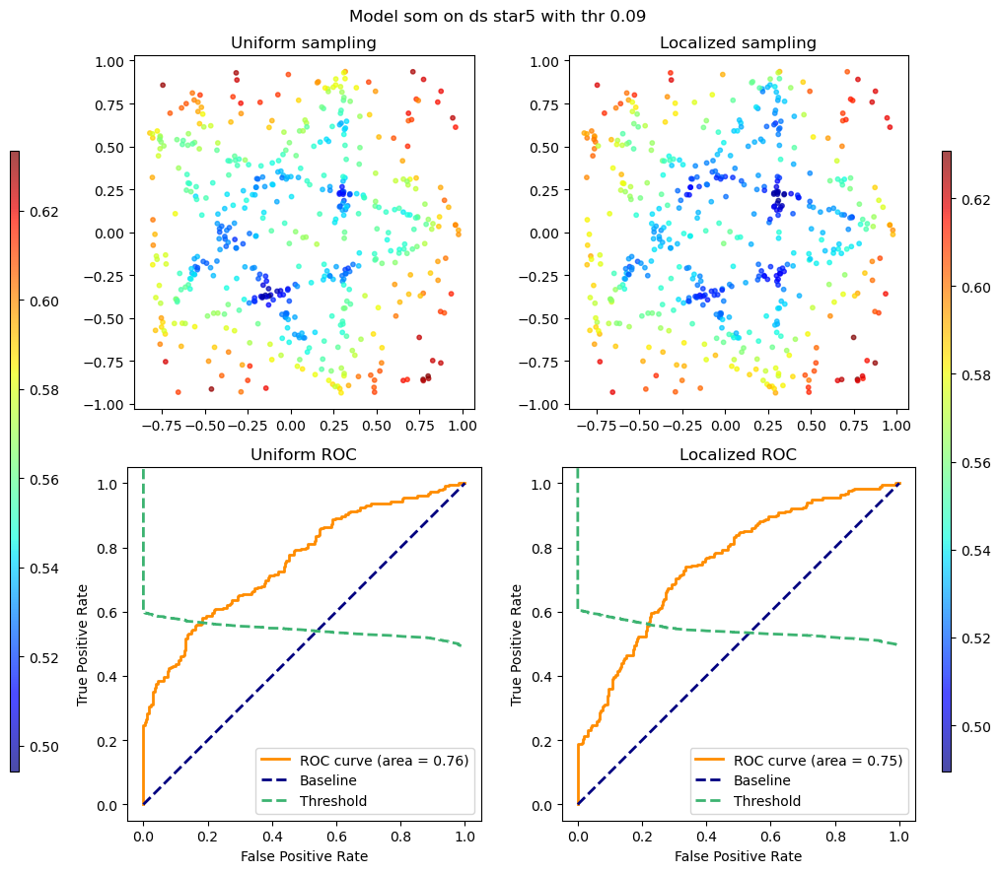

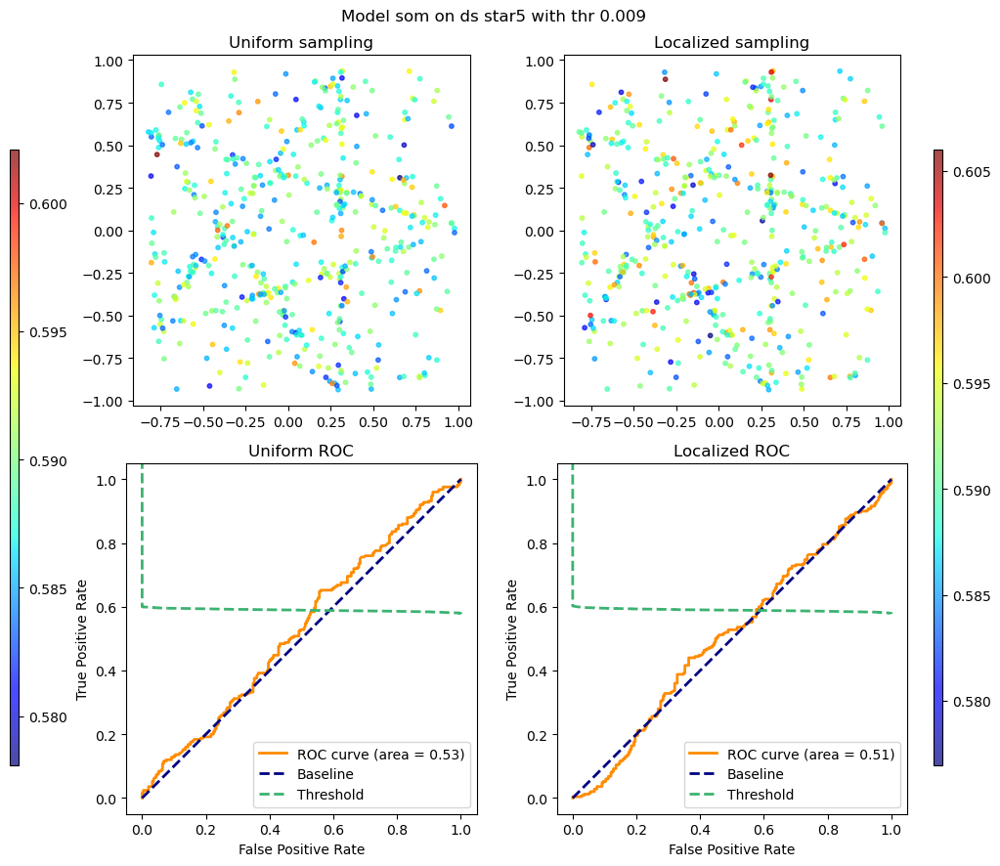

...

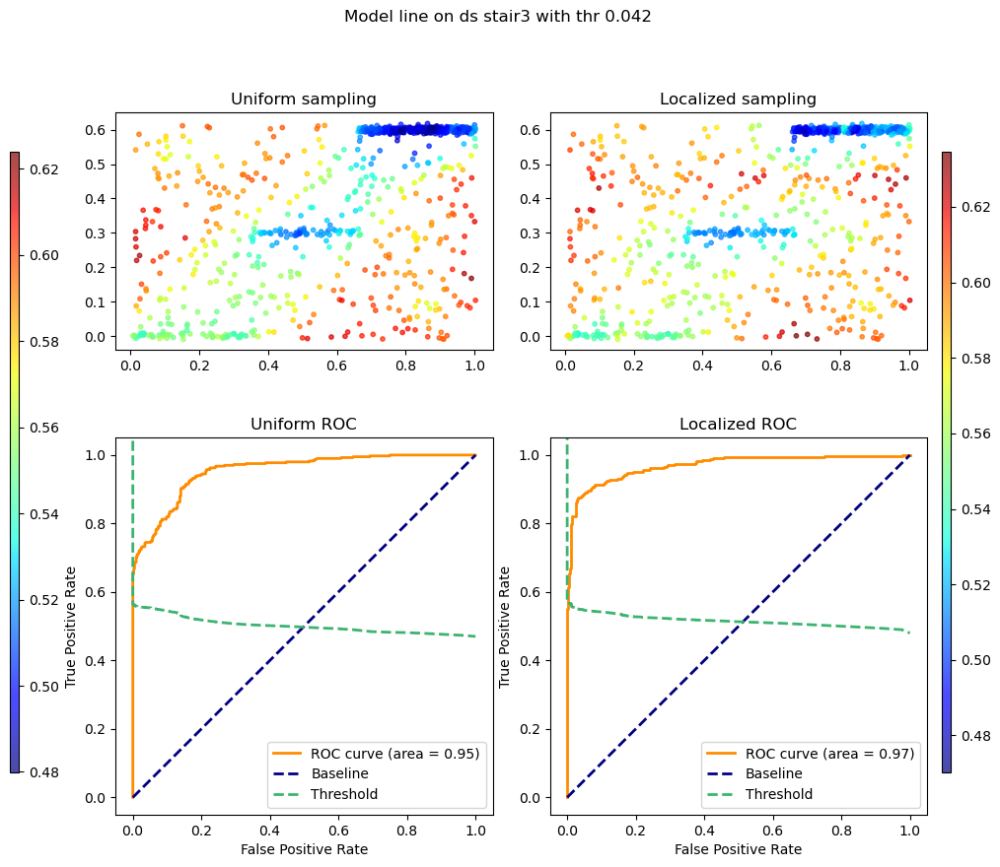

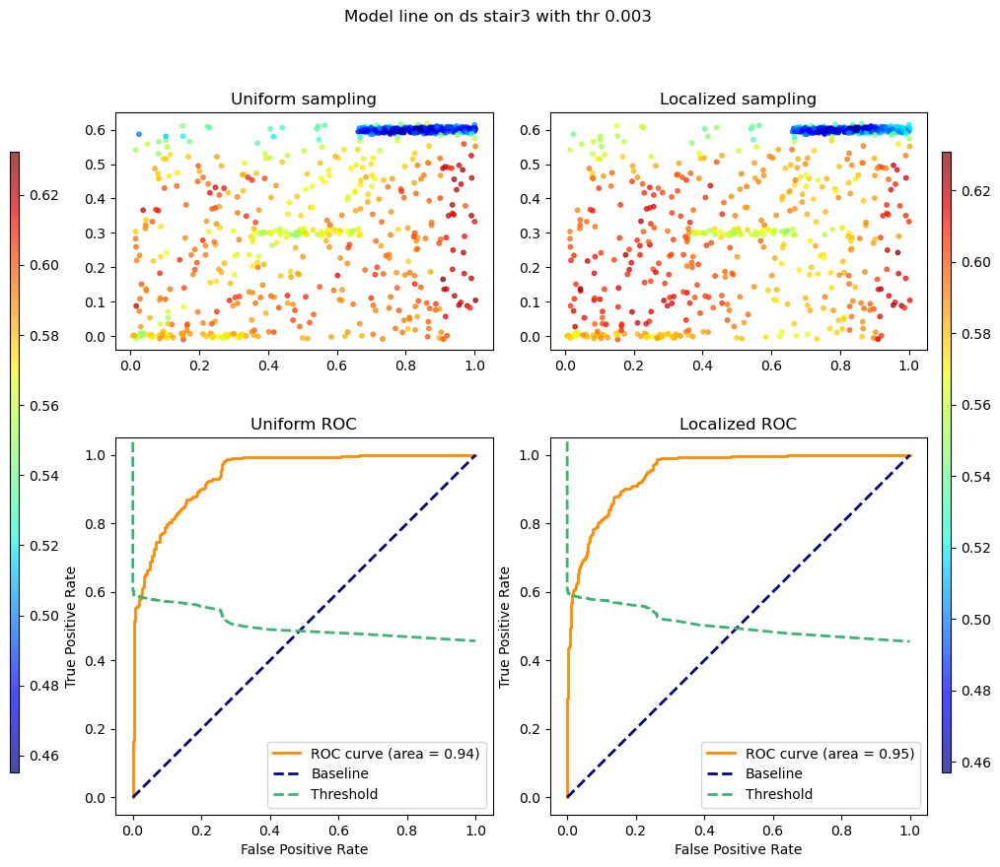

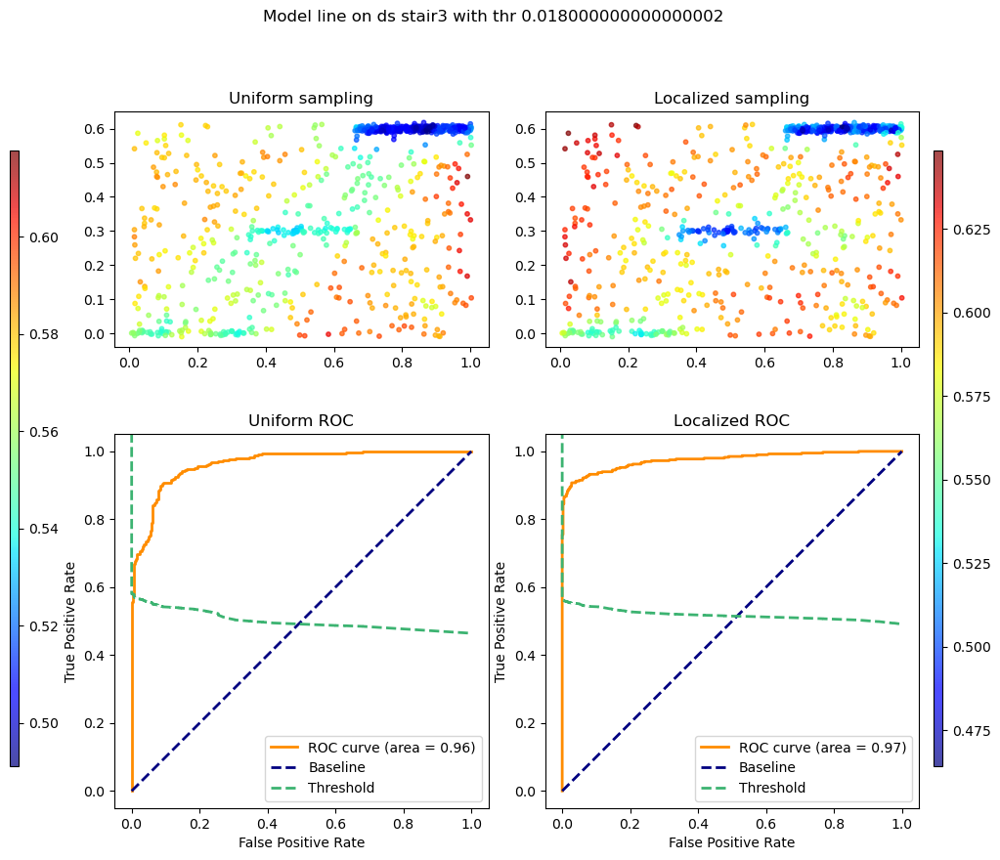

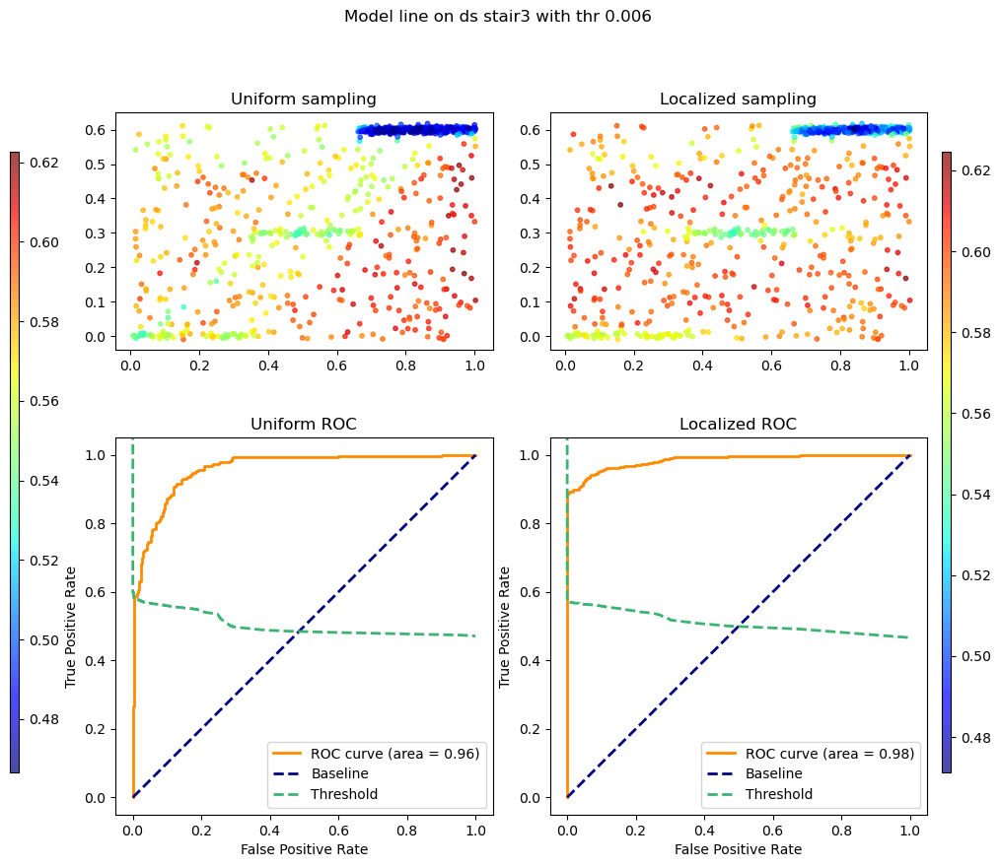

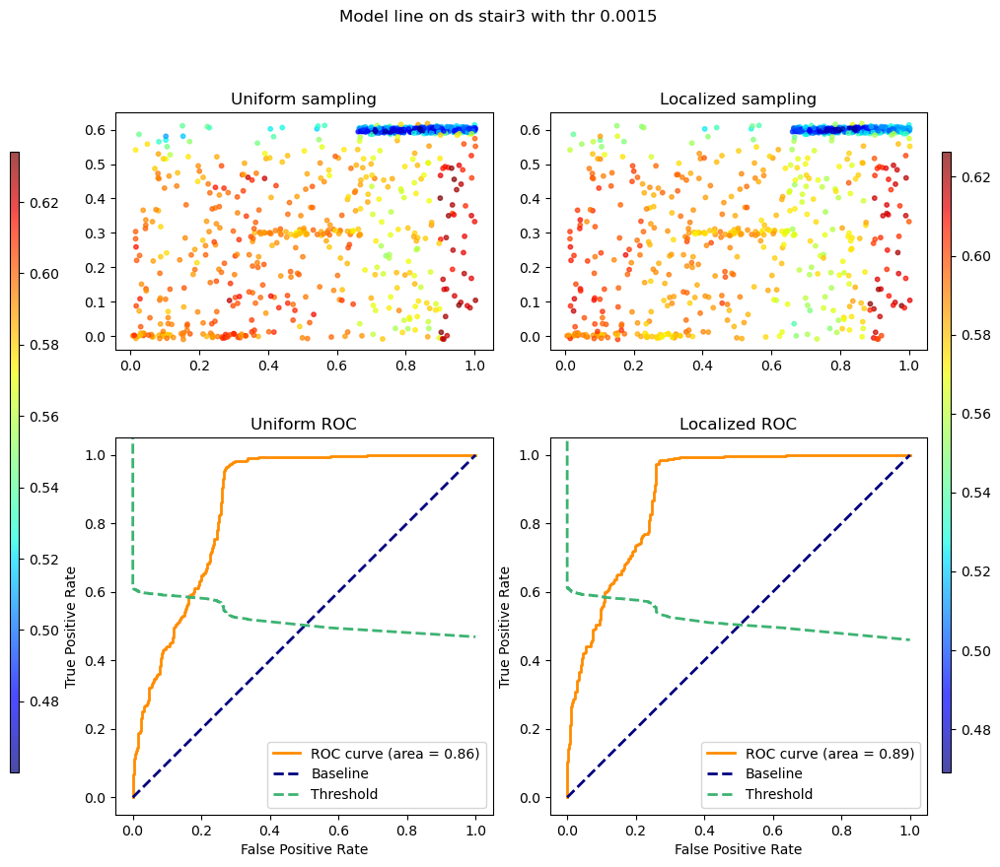

In [21]:
for model, dict1 in results.items():
    if model != SUBS:
        for ds_name, dict2 in dict1.items():
            ds, gt = load_dataset_by_name(ds_name, file_path=joinpath("..", "..", "..", f"datasets/2d/{'circles' if 'circle' in ds_name else 'lines'}/with_outliers"))
            for threshold, dict3 in dict2.items():
                try:
                    threshold = float(threshold)
                except:
                    # print(f"{model}-{ds_name}-{threshold} has got problems.")
                    continue
                uniform_scores_path = "../../../" + dict3["scores_path"]
                localized_scores_path = uniform_scores_path.replace(UNIFORM, LOCALIZED)

                uniform_scores = np.array(read_arr_json(uniform_scores_path))
                localized_scores = np.array(read_arr_json(localized_scores_path))
                fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(9, 9), dpi=100)

                ax1.set_aspect("equal")
                ax2.set_aspect("equal")
                ax3.set_aspect("equal")
                ax4.set_aspect("equal")

                im1 = ax1.scatter(ds[:,0], ds[:,1], c=uniform_scores, cmap="jet", s=10, alpha=0.7)
                ax1.set_title("Uniform sampling")
                im2 = ax2.scatter(ds[:,0], ds[:,1], c=localized_scores, cmap="jet", s=10, alpha=0.7)
                ax2.set_title("Localized sampling")
                fig.suptitle(f"Model {model} on ds {ds_name} with thr {threshold}")

                make_roc(gt=gt, scores=uniform_scores, orig_ax=ax3, title="Uniform ROC", show=False)
                make_roc(gt=gt, scores=localized_scores, orig_ax=ax4, title="Localized ROC", show=False)

                fig.tight_layout()
                fig.colorbar(im1, cax=fig.add_axes([1, 0.12, 0.01, 0.70]))
                fig.colorbar(im2, cax=fig.add_axes([-0.05, 0.12, 0.01, 0.70]))
                #plt.colorbar()
                plt.show()
                plt.close(fig)